<a href="https://colab.research.google.com/github/ZSchreiber06/BIOE5060_homework/blob/branch1/Final/Final_Colab_Julia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Welcome to a Julia Tutorial!**

In [ ]:
%%shell
set -e

#---------------------------------------------------#
JULIA_VERSION="1.8.2" # any version ≥ 0.7.0
JULIA_PACKAGES="IJulia BenchmarkTools"
JULIA_PACKAGES_IF_GPU="CUDA" # or CuArrays for older Julia versions
JULIA_NUM_THREADS=2
#---------------------------------------------------#

if [ -z `which julia` ]; then
  # Install Julia
  JULIA_VER=`cut -d '.' -f -2 <<< "$JULIA_VERSION"`
  echo "Installing Julia $JULIA_VERSION on the current Colab Runtime..."
  BASE_URL="https://julialang-s3.julialang.org/bin/linux/x64"
  URL="$BASE_URL/$JULIA_VER/julia-$JULIA_VERSION-linux-x86_64.tar.gz"
  wget -nv $URL -O /tmp/julia.tar.gz # -nv means "not verbose"
  tar -x -f /tmp/julia.tar.gz -C /usr/local --strip-components 1
  rm /tmp/julia.tar.gz

  # Install Packages
  nvidia-smi -L &> /dev/null && export GPU=1 || export GPU=0
  if [ $GPU -eq 1 ]; then
    JULIA_PACKAGES="$JULIA_PACKAGES $JULIA_PACKAGES_IF_GPU"
  fi
  for PKG in `echo $JULIA_PACKAGES`; do
    echo "Installing Julia package $PKG..."
    julia -e 'using Pkg; pkg"add '$PKG'; precompile;"' &> /dev/null
  done

  # Install kernel and rename it to "julia"
  echo "Installing IJulia kernel..."
  julia -e 'using IJulia; IJulia.installkernel("julia", env=Dict(
      "JULIA_NUM_THREADS"=>"'"$JULIA_NUM_THREADS"'"))'
  KERNEL_DIR=`julia -e "using IJulia; print(IJulia.kerneldir())"`
  KERNEL_NAME=`ls -d "$KERNEL_DIR"/julia*`
  mv -f $KERNEL_NAME "$KERNEL_DIR"/julia

  echo ''
  echo "Successfully installed `julia -v`!"
  echo "Please reload this page (press Ctrl+R, ⌘+R, or the F5 key) then"
  echo "jump to the 'Checking the Installation' section."
fi

Unrecognized magic `%%shell`.

Julia does not use the IPython `%magic` syntax.   To interact with the IJulia kernel, use `IJulia.somefunction(...)`, for example.  Julia macros, string macros, and functions can be used to accomplish most of the other functionalities of IPython magics.


Initial setup comes from this notebook: https://colab.research.google.com/github/ageron/julia_notebooks/blob/master/Julia_for_Pythonistas.ipynb

# Background



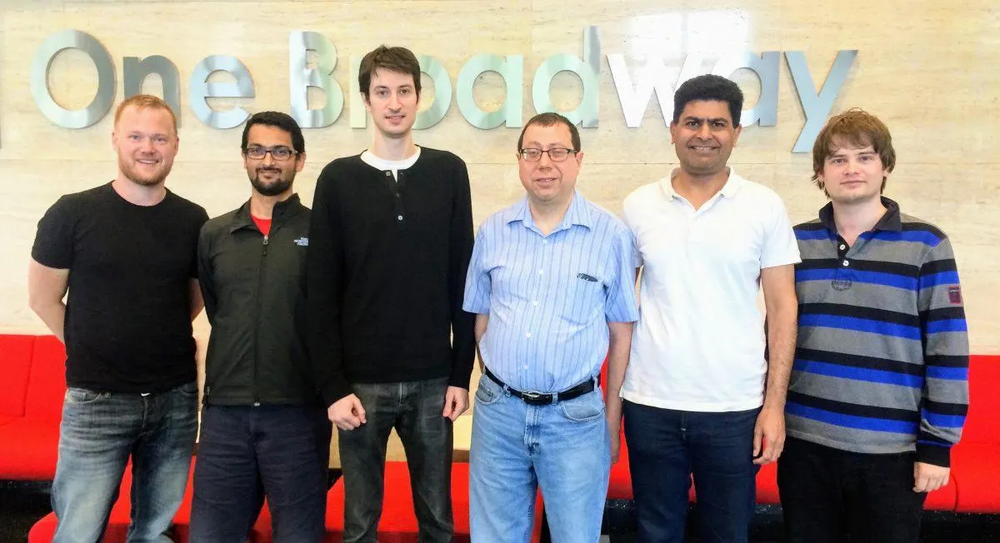

Image source: https://www.forbes.com/sites/suparnadutt/2017/09/20/this-startup-created-a-new-programming-language-now-used-by-the-worlds-biggest-companies/

# Background

***Julia*** is a relatively new langue that was created back in 2009 by Jeff Bezanson, Stefan Karpinski, Viral B. Shah, Alan Edelman.
According to the creators, they developed Julia "because [they] are greedy."


They wanted a language with the following:
- Open source
- Speed of C
- Dynamics of Ruby
- String Processing of Perl
- Linear Algebra of MATLAB
- Mathematical notation like MATLAB
- Homoiconic like Lisp
- Statistics like R
- General Purposes like Python
- Simple to learn (while maintaining complex abilities)
- Interactive and Compiled

---


### Important things to know about Julia

✔  Julia gets great it's speed from something called a just-in-time (JIT) compiler. This is similar to Python's PyPy. Therefore, there is explicit compilation needed like in C. JIT compilers work by complying with the code at runtime. This allows for the flexibility of interpreter language while maintaining the speed of the compiler.


✔ Flexible parametric type system so static typing can be used. But excitingly in addition types can also take parameters allowing for one function to have multiple methods based on the parameters of the user input.


✔ Indentation is not required for parsing (unlike Python).


✔ Semi-colons (;) are not required for suppression (unlike MATLAB, but similar to Python).


✔ Julia scripts end in ".jl"


✔ Julia is a column major language, meaning it is Fortran ordered like Matlab


✔ Can run natively on GPU.


---
### Additional Resources

Although the Julia community is small, there is still great documentation and tutorials online! To learn more about Julia, check out these awesome resources!

Julia's documentation on their website:
https://docs.julialang.org/en/v1/

Julia Accademey: https://juliaacademy.com/

Doggo dot jl's youtube channel: https://www.youtube.com/@doggodotjl

Full tutorial: https://www.youtube.com/watch?v=KlorfxsdWDw

Julia in 100 seconds: https://www.youtube.com/watch?v=JYs_94znYy0



# Strengths and Weaknesses

## **Strengths**
✅ Open Source

✅ JIT Compilation

✅ Eaily calls other languages

✅ Linear Algebra

✅ Multiple Dispatch

✅ Scientific Computing

✅ GPU, parralleism, metaprograming

## **Weaknesses**
❌ Young Language

❌ Limited Documentation

❌ Slow initial startup

❌ Complicated package management

❌ Not much GUI support

❌  Memory management causing performance issues




### ***Some beautiful Julia memes for your enjoyment***

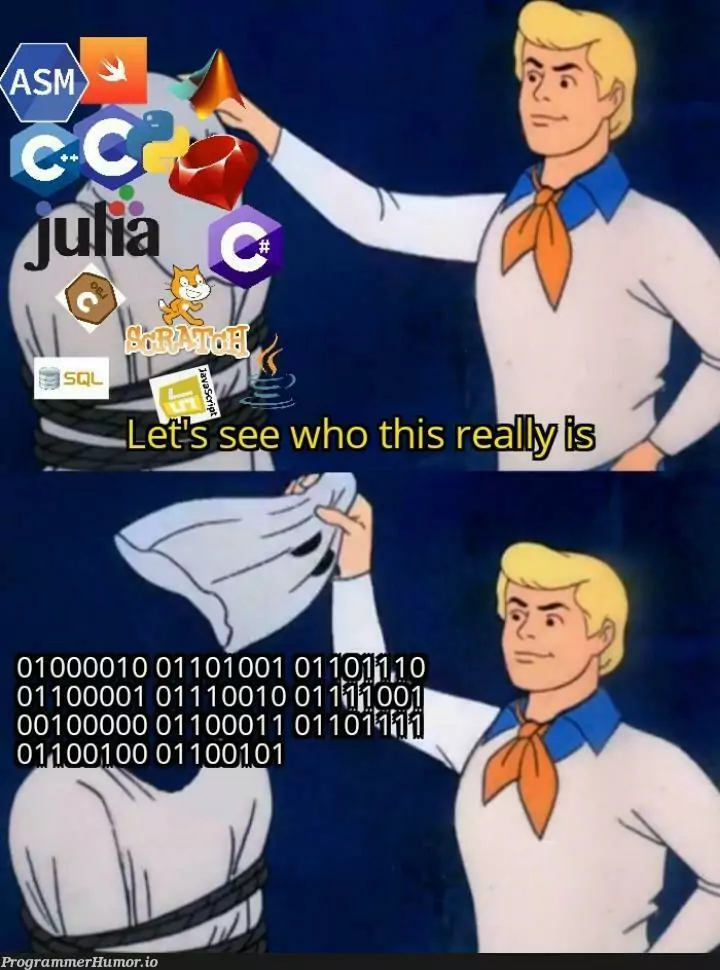

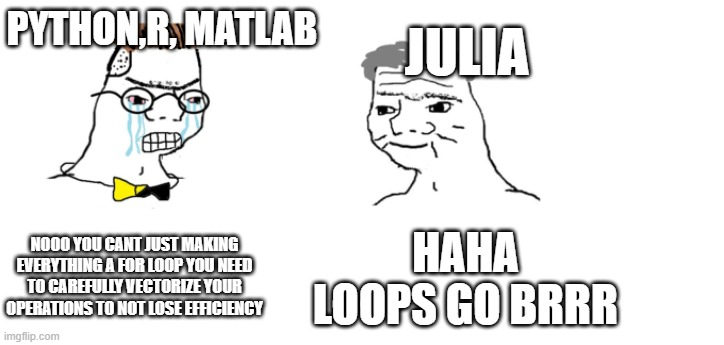

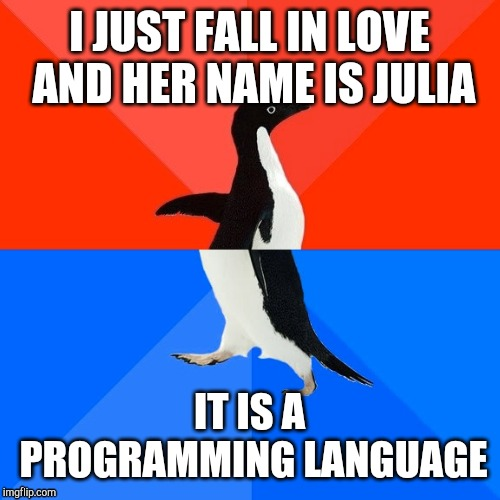

Image sources:

https://x.com/harijayashankar/status/1632939084065767426?mx=2

https://imgflip.com/i/2wir8a
https://programmerhumor.io/programming-memes/none-binary-languages-dont-exist/

https://towardsdatascience.com/learn-the-art-of-data-science-programming-languages-of-the-decade-a2850830ab76?gi=498931a0567b

# Julia Synopsis


###Integer types in Julia


***Signed Integer*** - postive and negative numbers.

***Unsigned Integer*** - only postive numbers.

***Bool*** - true or false.

Integer types:

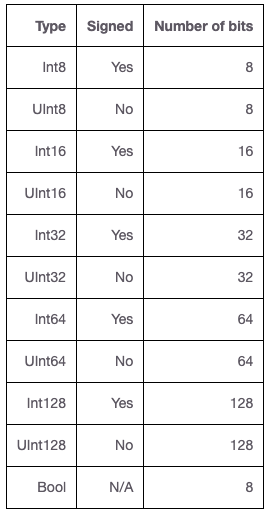


Floating-point types:



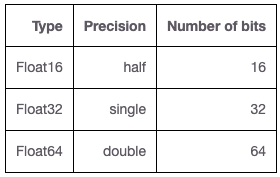

Images source: https://discdown.org/fabulousjulia/pages/introduction/basis_datatypes_and_operations/#:~:text=Julia%20supports%20basic%20data%20types,is%20a%20subtype%20of%20Any%20.

### Julia basic data types

| Syntax    | meaning |
| -------- | ------- |
| `string = "Julia"`  |  String  | |
| `char = 'J'` | Char can only be one letter | |
| `:symbol`  |  Symbol |  |
| `Bool`  |  Represnts logical values (true or false)  |  |
| `Dict()`  |  Dictionary  |  
| `a:b/a:c:b`  | Range, a to b/ a to b with steps size c  |
| `()`  | Used for tuple | |
| `[]`  | Used for arrays | ||
| `[a, b, c]`  | 1D array | |
| `[[10,9] [8,7]]`  | 2x2 Matrix |
| `Complex{Int64}`  | Represents Complex  Number|  |
| `Rational{Int64}` | Represents Rational Number|  |
| `::`  |  Defines data type  |  |

### Julia Basic Functions

| Functions/Syntax   | Meaning |
| -------- | ------- |
| `?obj`  | Help equivalent to help(obj) in Python |  |
| `push!(J, a)/append!(J,a)`  | Add a to last item of array J  | |
| `pop!(J)`  | Remove last item of array J  | |
| `sort(J)`  | Sort elements in array J  | |
| `stack(j)`  | Makes a vector of vectors | |
| `eltype(j)`  | Types of elements in j | |
| `length(j)`  | Number of elements in j|  |\
| `isequal(j,u)`  | If j and u are the same|  |
| `isodd(j)/iseven(j)`  | If j is odd/even|  |
| `uppercase()/lowercase()`  | Makes letters in a string upper/lowercase|  |
| `isfinite(j)`  |If j is finite number|  ' |
| `isinf(j)`  | If j is infinite|  ' |
| `isnan(j)`  | If j is not a number|  | |
| `typeof(j)`  | Returns type of j | |
| `sleep()`  | Pauses program for number of seconds entered|  |
| `a <: b`  | Checks if subtypes of a and b are the same |  |
| `Type[a, b, c]`  | Defines array to be type "Type" | |
| `reverse()` | Reverses input|  |
| `map(function, J)` | Applies function to each element in array|  |
| `function f() `  | Creates a Function f() | |
| `println("Hey guys!") `  | Prints `Hey guys!`| |
| `;;;`  | # of semicolons in separators specifices dimenison (3D here)|  |


### Julia Mathmatical Operations (with some Linear Algebra)


| Functions    | Meaning |
| -------- | ------- |
| `.+ .- .\ .*`  | Apply opperations to arrays | |
| `eigvals(J)/eigvecs(J)`  | Eigenvalues/Eigenvectors of matrix J | |
| `dot(J,U)`  | Dot product of the vectors J and U | |
| `norm(J)`  | Norm/Magnitude of vector J | |
| `normalize(J)`  | Normalize vector J| |
| `cross(J,U)`  | Cross product of vectors J and U | |
| `cat/hcat/vcat`  | Concatenates the input array along dimension/horizonally/vertically | |
| `lu(J)`  | Decomposition of matrix J | |
| `symmat(J)`  | Creates a symmetric matrix from J | |
| `diagm(J)`  | Creates diagonal matrix from vector J | |
| `logm(J)`  | Logarithm of matrix J | |
| `rank(J)`  | Rank of matrix J | |



In [ ]:
!julia

               _
   _       _ _(_)_     |  Documentation: https://docs.julialang.org
  (_)     | (_) (_)    |
   _ _   _| |_  __ _   |  Type "?" for help, "]?" for Pkg help.
  | | | | | | |/ _` |  |
  | | |_| | | | (_| |  |  Version 1.8.2 (2022-09-29)
 _/ |\__'_|_|_|\__'_|  |  Official https://julialang.org/ release
|__/                   |



Unhandled Task ERROR: InterruptException:
Stacktrace:
  [1] poptask(W::Base.InvasiveLinkedListSynchronized{Task})
    @ Base ./task.jl:921
  [2] wait()
    @ Base ./task.jl:930
  [3] wait(c::Base.GenericCondition{Base.Threads.SpinLock})
    @ Base ./condition.jl:124
  [4] wait_readnb(x::Base.TTY, nb::Int64)
    @ Base ./stream.jl:416
  [5] eof(s::Base.TTY)
    @ Base ./stream.jl:106
  [6] eof(io::REPL.Terminals.TTYTerminal)
    @ Base ./io.jl:439
  [7] match_input(k::Dict{Char}, s::Union{Nothing, REPL.LineEdit.MIState}, term::Union{REPL.Terminals.AbstractTerminal, IOBuffer}, cs::Vector{Char}, keymap::Dict{Char}) (repeats 4 times)
    @ REPL.LineE

# Arrays
**Arrays** are used to store and orgainize collections of data.

To define arrys we use  `[ ]`.

In [ ]:
# Start by defining some arrays
col_vec = [8,9,10] # Column vector (1D)
println("Column vector is: ", col_vec," With the type of: ", typeof(col_vec))

row_vec = [8 9 10] # Row vector (2D)
println("Row vector is: $row_vec. With the type of: $(typeof(row_vec)).")

Column vector is: [8, 9, 10] With the type of: Vector{Int64}
Row vector is: [8 9 10]. With the type of: Matrix{Int64}.


In [ ]:
# 3x3 Matrices
a = [1 2 3; 3 2 1; 1 2 3]
b = [3 2 1;
     1 2 3;
     3 2 1]
println("a = $a\nb = $b\nType of matrices a & b are $(typeof(a)), $(typeof(b)), respectively.")


# Mathmatical operations on vectors

# Add Arrays
println("Adding arrays a and b gives us: $(a.+b)")

# Element-wise addition operation
println("Adding 2 t each element in array a: $(a .+ 2)")


println("Length of matrix b is $(length(b)).")

# Indexing elements in arrays
println("Element in row 2 column 3: $(b[2,3])")
println("Element in row 2 column 3: $(b[8])")

a = [1 2 3; 3 2 1; 1 2 3]
b = [3 2 1; 1 2 3; 3 2 1]
Type of matrices a & b are Matrix{Int64}, Matrix{Int64}, respectively.
Adding arrays a and b gives us: [4 4 4; 4 4 4; 4 4 4]
Adding 2 t each element in array a: [3 4 5; 5 4 3; 3 4 5]
Length of matrix b is 9.
Element in row 2 column 3: 3
Element in row 2 column 3: 3


In [ ]:
# Declare type of elements in the array
flo_vec = Float16[5.6, 7.8, 9.0, 3.4]
println("flo_vec type is: $(typeof(flo_vec)).")

# Sum all elments in vector
println("Sum of elements in flo_vec is: $(sum(flo_vec)).")

# Sum first and last elements by accessing last element in array
mysum = flo_vec[1] + flo_vec[end]
println("Sum of first and last elements in flo_vec is: $mysum")

# Sort elements in a vector
println("Sorting flo_vec gives us: $(sort!(flo_vec)).")

# Add new/removing elements
new_num = Float16(7.6)
push!(flo_vec, new_num) # add element to end of vector
println("After adding element, new flo_vec is: $(flo_vec)")
pop!(flo_vec) # remove last element from vector
println("After removing element, new flo_vec is: $(flo_vec)")

flo_vec type is: Vector{Float16}.
Sum of elements in flo_vec is: 25.81.
Sum of first and last elements in flo_vec is: 9.0
Sorting flo_vec gives us: Float16[3.4, 5.6, 7.8, 9.0].
After adding element, new flo_vec is: Float16[3.4, 5.6, 7.8, 9.0, 7.6]
After removing element, ew flo_vec is: Float16[3.4, 5.6, 7.8, 9.0]


In [ ]:
# Change the value of an element in an array
fun_color_names = ["viridian", "zaffre", "magenta"]
println(fun_color_names)
fun_color_names[3] = "heliotrope"
println(fun_color_names)

["viridian", "zaffre", "magenta"]
["viridian", "zaffre", "heliotrope"]


In [ ]:
## Arrays do not need same data type
crazy_array = ["🙂", 5, 5.555, 1+2, "much wow", [1 2 3], length(a)]

7-element Vector{Any}:
  "🙂"
 5
 5.555
 3
  "much wow"
  [1 2 3]
 9

# Structs
**Structs** are custom data structures. In Julia, they are a collection named fields that is define by the user. There are two types of structs, mutable and immutable.
Immutable structs are the default in Juilia. If you are looking to change feilds' values use ``` mutable struct```.

In [ ]:
# Start by declairing a mutable struct
mutable struct Car
  make::String    # Define data type
  model::String
  year::Integer
  mileage::Integer
end

# Create a struct instance
mystruct = Car(
    "Dodge",
    "Ram 1500",
    2014,
    160000
)
println(mystruct)


# Access specific element
println(mystruct.make)

# Change value
mystruct.mileage = 1600
println(mystruct)

Car("Dodge", "Ram 1500", 2014, 160000)
Dodge
Car("Dodge", "Ram 1500", 2014, 1600)


# Dictionary
In Julia, a dictionary is a colletion of key-value pairs.

These key-value pairs let you access and change the data within them.

In [ ]:
# Start by creating a dictionary
mydictionary = Dict(
    "Dog's name" => "Hoka",
    "Breed" => "Lab",
    :weight => 50
)
println(mydictionary["Dog's name"])


# Change a value
mydictionary["Breed"] = :Retriever
println(mydictionary)

# Add entry
mydictionary[:age] = 1
println(mydictionary)

# Remove entry
pop!(mydictionary,:weight)
println(mydictionary)


Hoka
Dict{Any, Any}(:weight => 50, "Breed" => :Retriever, "Dog's name" => "Hoka")
Dict{Any, Any}(:weight => 50, :age => 1, "Breed" => :Retriever, "Dog's name" => "Hoka")
Dict{Any, Any}(:age => 1, "Breed" => :Retriever, "Dog's name" => "Hoka")


# Tuples
Tuples are an immutable ordered collection of elements.

These elements can be different types, but once defined they cannot be altered.

In [ ]:
# Tuples
mytuple = ("chicken", "cow", "pig", 3)
(animal1, animal2, animal3, totalnum) = mytuple
animal1
animal2
animal3
println(animal1)
println(animal2)
println(animal3)

# NamedTuple
mytuple2 = (
    animal1 = "chicken",
    animal2 = "cow",
    animal3 = "pig",
    totalnum = 3)

# Access the 3rd animal
println("The 3rd animal is a $(mytuple2.animal3).")

chicken
cow
pig
The 3rd animal is a pig.


# Ternary Operators
Expressed as: `mycondition ? process1 : process2`

Ternary Operators evaluate expression `process1` (expression before :) if the condition, `mycondition` is true. If false, expression `process2` (expression after :) is evaluated.


---

Documentation : https://docs.julialang.org/en/v1/manual/control-flow/

In [ ]:
# Ternary Operator
a = 1;
b = 2;

# Define processes/tasts
process1() = println("a is less than b")
process2() = println("a is greater than b")

a < b ? process1() : process2()

# Adding a nested process
process3 = println("a is equal to b")

a < b ? process1() : (a == b ? process3() : process2())


a is less than b
a is equal to b
a is less than b


# Loops
***if loops***

`if` loops are conditional. Certian codes are executed based on if the  condition is meet or not.

***for loops***

`for` loops iterate over a range, array, or any iterable collection and execute code for a specified number of times.

***while loops***

`while` loops repeatedly excute code as long as the given condtion is true. Once the condition is false the loop is terminated.

## If Loop

In [ ]:
# Define tasks for the loop to complete
a_ford() = println("Rust bucket = ")
a_chevy() = println("Say goodbye to your transmission = ")
a_ram() = println("Greatest truck, no competition = ")

truck = ["Ford", "Chevy", "Ram"]
make = truck[3]

# If loop
if make == "Ford"
  a_ford()
elseif make == "Chevy"
  a_chevy()
elseif make == "Ram"
  a_ram()
else
  println("Is that even a real truck?")
end


println("$make")

Greatest truck, no competition = 
Ram


## For Loop

In [ ]:
# First define an array
days_of_week = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Write the for loop
for i = 1:length(days_of_week)
  println(days_of_week[i])
end


# Make blank space
for blank in 1:3
  println()
end

# Use in the write same loop as one with =
for day in days_of_week
  println(day)
end

Monday
Tuesday
Wednesday
Thursday
Friday
Saturday
Sunday



Monday
Tuesday
Wednesday
Thursday
Friday
Saturday
Sunday


In [ ]:
# For loops using a range

# Range of numbers firstnum:stepsize:lastnum
firstnum = 1
lastnum = 10
stepsize = 2

for i = firstnum:stepsize:lastnum
  println(i)
  sleep(1)
end

println()

# Can loop over string since in Julia a string is get a collection of characters
jul_string = "We love Julia!"
for letter in jul_string
  println(letter)
end

1
3
5
7
9

W
e
 
l
o
v
e
 
J
u
l
i
a
!


## While Loops

In [ ]:
# While loop

# Define a variable
a = 200

# Create the wile loop
while a > 90
  println("Currently a = ",a)
  a -= 10
end

# Indefinite while loop
while true
  println("This will print forever")
  sleep(3) # waits 3 seconds
end

Currently a = 200
Currently a = 190
Currently a = 180
Currently a = 170
Currently a = 160
Currently a = 150
Currently a = 140
Currently a = 130
Currently a = 120
Currently a = 110
Currently a = 100
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will print forever
This will 

LoadError: InterruptException:

In [ ]:
# While loop, once condition is false computre stops
a = 0;
iterCount = 0; # Number of while loops exceuted
while a <= 100
  a += π*2
  a = floor(a)
  println("a = $a.")
  iterCount += 1;
end
println("Total numer of iterations is $(iterCount).")

a = 6.0.
a = 12.0.
a = 18.0.
a = 24.0.
a = 30.0.
a = 36.0.
a = 42.0.
a = 48.0.
a = 54.0.
a = 60.0.
a = 66.0.
a = 72.0.
a = 78.0.
a = 84.0.
a = 90.0.
a = 96.0.
a = 102.0.
Total numer of iterations is 17.


# Functions
Functions take an input, excute a task on said input, and then produce an output. To create functions in Julia we simply use `function`.

In [ ]:
# Create a function
function func_1(J::Number,U::Number)
  return J*U
end

# One line function in Julia
func_2(J::Number,U::Number) = J*U

# Anonymous function in Julia (no name)
func3 = (J::Number,U::Number) -> J*U

# Calling the Functions
println("Function 1 produces: ", func_1(2,5)) # don't have to put %d
println("Function 2 produces: ", func_2(2,5))
println("Function 3 produces: ", func3(2,5))

Function 1 produces: 10
Function 2 produces: 10
Function 3 produces: 10


# Intermediate/Advanced Topic: **Multiple Dispatch**

In Julia, `functions` are considered generic functions meaning that they are one function comprised of multiple definitions or methods. The word method in Julia means "a definition of one possible behavior for a function". This is different from other object-orientated languages (Java and Python) in which a method typically means a funciton tied to some object.



In Julia, **multiple dispatch** uses the types of all input arguments determines to which function is called. This allows for an eviroment which is both flexable and efficent. Additonally,it allows you to write a program that works on a variety of types. This is done by defining `functions` using the same names



---


Source:
https://docs.julialang.org/en/v1/manual/methods/

In [ ]:
# Method Overloading

function myvariable(variable::String)
  println("My variable is a string.")
end

function myvariable(variable::Int) # Reuse function name but change data type
  println("My variable is an integer.")
end

function myvariable(variable::Float64)
  println("My variable is a float.")
end

function myvariable(variable::Any)
  println("My variable is not a string, integer, or float.")
end

myvariable (generic function with 4 methods)

In [ ]:
# Use different inputs and call the functions
myvariable("Hello")
myvariable(5)
myvariable(5.5)
myvariable(:symbol)

My variable is a string.
My variable is an integer.
My variable is a float.
My variable is not a string, integer, or float.


In [ ]:
# Add another method
function myvariable(variable::Symbol)
  println("My variable is a symbol.")
end

myvariable(:symbol)

My variable is a symbol.


In [ ]:
# All inputs matter

function addup(a::Int, b::Int)
  return a + b
end

function addup(a::Int, b::Float64)
  return a + b
end

println(addup(1,2))
println(addup(1,2.0))

3
3.0


In [ ]:
# Abstract Types and Subtypes
abstract type SimpleMath end

struct Addition <: SimpleMath
  x::Float64
  y::Float64
end

struct Subtraction <: SimpleMath
  x::Float64
  y::Float64
end

struct Multiplication <: SimpleMath
  x::Float64
  y::Float64
end

struct Division <: SimpleMath
  x::Int64
  y::Int64
end

# Define Function
function math(math::Addition)
  return math.x + math.y
end

function math(math::Subtraction)
  return math.x - math.y
end

function math(math::Multiplication)
  return math.x * math.y
end

function math(math::Division)
  return math.x / math.y
end

println(math(Addition(1.0, 2.0)))
println(math(Subtraction(1, 2)))
println(math(Multiplication(1.0, 2.0)))

3.0
-1.0
2.0



# Booleans
Booleans represent truth values and are used in conditional or logical operations. Possible values are `true` or `false`.

Boolean opeators:

`&&` means **and**

`||` means **or**

`!` means **not**

In [ ]:
# Booleans
a = 90
b = 90

if a != b
  println("a and b are NOT equal")
else
  println("a and b are equal")
end

a and b are equal


## User input example with Booleans
The bellow example makes use of user inputs (read from line) and puts them through Boolean operations.

In [ ]:
# User input
short_races = ["400m", "800m", "1 mile"]
mid_races = ["5k", "10k", "Half Marathon"]
long_races = ["Marathon", "50k", "100k"]
types = ["short", "mid", "long"]

println("Please input the type of races like (short, mid, long):")
flush(stdout) # Froces print message to be displayed
race_type = readline()

if race_type in types
  is_short = race_type == "short"
  is_mid = race_type == "mid"
  is_long = race_type == "long"


  println("Please input the milage of race:")
  flush(stdout)
  race_milage = readline()

  is_in_short_races = race_milage in short_races
  is_in_mid_races = race_milage in mid_races
  is_in_long_races = race_milage in long_races

  if is_in_mid_races == true
    println("You either love or hate to run...")
  elseif is_in_mid_races != true && is_in_long_races != true
    println("You hate to run :(")
  elseif is_in_long_races == true
    println("You LOVE to run!")
  end

  else
  println("Please enter a valid race length: 400m, 800m, 1 mile, 5k, 10k, Half Marathon, Marathon, 50k, 100k.")

  println("Please enter a valid race type: short, mid, long.")

end



Please input the type of races like (short, mid, long):
stdin> long
Please input the milage of race:
stdin> 50k
You LOVE to run!


Flush stdout: https://docs.julialang.org/en/v1/base/io-network/#Base.flush

Flush function `flush()` outputs all data in buffer to the standard output (stdout).

# Coperablilty With Other Languages
Julia is highly interoperable with other languages. You can directly call a C function and work with other language libraries.

Examples:

To call C use `ccall`

To call R use `RCall`

To call Python use `PyCall`

In [ ]:
# Import PyCall package
using Pkg
Pkg.add("PyCall")
Pkg.add("PyPlot")
using PyCall

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
   Installed MacroTools ─ v0.5.13
   Installed PyCall ───── v1.96.4
    Updating `~/.julia/environments/v1.8/Project.toml`
  [438e738f] + PyCall v1.96.4
    Updating `~/.julia/environments/v1.8/Manifest.toml`
  [1914dd2f] + MacroTools v0.5.13
  [438e738f] + PyCall v1.96.4
    Building PyCall → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/9816a3826b0ebf49ab4926e2b18842ad8b5c8f04/build.log`
Precompiling project...
  ✓ MacroTools
  ✓ PyCall
  2 dependencies successfully precompiled in 14 seconds. 20 already precompiled.
   Resolving package versions...
   Installed Reexport ────────── v1.2.2
   Installed LaTeXStrings ────── v1.4.0
   Installed PyPlot ──────────── v2.11.5
   Installed ColorTypes ──────── v0.11.5
   Installed FixedPointNumbers ─ v0.8.5
   Installed Colors ──────────── v0.12.11
    Updating `~/.julia/environments/v1.8/Project.toml`
  [d330b81b] + PyPlot v2.11.5
    Up

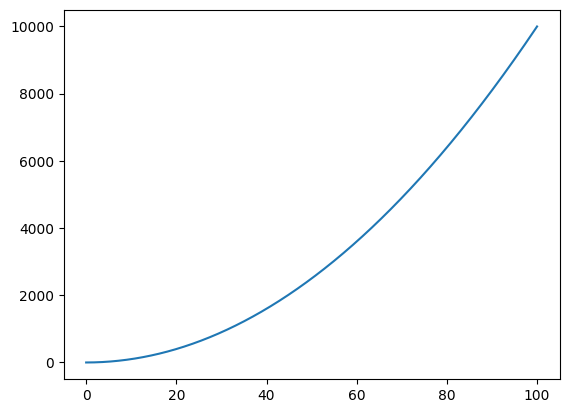

In [ ]:
using PyPlot
# Call Python's plot
plt = pyimport("matplotlib.pyplot")
a = range(0,100, length=1000)
plt.plot(a,a.^2)
plt.show()

# Reading and Writing Files
📖 Reading a file means that you are accessing a preexisting file, opening it, and retrieving its contents.

🖊 Writing a file means that you are either creating or modifying data in a new or preexisting file.

Documentation: https://docs.julialang.org/en/v1/base/io-network/

In [ ]:
# For this example, lets start by making a dictionary
myrecipes= Dict(
    "Carrot Cake" => "flour, sugar, eggs, carrots, rasins baking soda, cinnamon, vanilla, cream cheese frosting",
    "Cheese Cake" => "cream cheese, sugar, eggs, butter, graham crackers",
    "Chocolate Chip Cookies" => "flour, sugar, eggs, butter, baking soda, vanialla, chocolate chips"
)

# Loop over values and keys to print
for(key, value) in myrecipes
  println("$key: \t$value")
end


Carrot Cake: 	flour, sugar, eggs, carrots, rasins baking soda, cinnamon, vanilla, cream cheese frosting
Cheese Cake: 	cream cheese, sugar, eggs, butter, graham crackers
Chocolate Chip Cookies: 	flour, sugar, eggs, butter, baking soda, vanialla, chocolate chips


In [ ]:
# Write a file

# Can use println() instead or write to write data line by line
myfile1 = open("myrecipies_dict2.txt", "w")

# Write to file
for (key, value) in myrecipes
  write(myfile1, "$key: \t$value\n")
end

# Close file
close(myfile1)

In [ ]:
# Read a file

# Open file
myfile2 = open("myrecipies_dict2.txt", "r")

# Read each line in my file
for i in eachline(myfile2)
  println(i)
end

# Close file
close(myfile2)

Carrot Cake: 	flour, sugar, eggs, carrots, rasins baking soda, cinnamon, vanilla, cream cheese frosting
Cheese Cake: 	cream cheese, sugar, eggs, butter, graham crackers
Chocolate Chip Cookies: 	flour, sugar, eggs, butter, baking soda, vanialla, chocolate chips


# Intermeidate/Advanced
This fun example makes use of Dictonary, Boolean, Function, and Julia's abillity to call other langauges.

In [ ]:
using IJulia

function open_url(url::String)
  IJulia.display("text/javascript", "window.open('$url','_blank');")
end

fav_christmas_song = ["Christmas Eve/Sarajevo 12/24", "The First Noel", "Slinet Night", "Run Rudolph Run"]


function christmas_song(song::String)
  song_urls = Dict(
  "Christmas Eve/Sarajevo 12/24" => "https://www.youtube.com/watch?v=2LbmhneqBnE",
  "The First Noel" => "https://www.youtube.com/watch?v=0u5UvnKlCTA",
  "Slinet Night" => "https://www.youtube.com/watch?v=_vw--yxcDNM",
  "Run Rudolph Run" => "https://www.youtube.com/watch?v=YiadNVhaGwk"
  )

  # Check if song name in list
  song_in_list = haskey(song_urls, song)

  if song_in_list  # Use Boolean, if true
    url = song_urls[song]
    printstyled("Playing your favorite Christmas Song: $song $url",color=:green)
    sleep(4)

    # Use Java script funtion to open link
    # open_url(url) # uncomment

  else
    println("Your favorite song, $song, isn't good enough to be in the list. Sorry.")
  end

  return song_in_list # Return the Bolean value and indicate if song exists
end

# print(christmas_song("Christmas Eve/Sarajevo 12/24")) # uncomment




SyntaxError: invalid syntax (<ipython-input-1-f0c7dc2b91bb>, line 1)

Sources that helped me form this:

https://stackoverflow.com/questions/61334777/is-there-any-way-to-open-a-new-tab-using-a-webbrowser-module-of-python-in-colab

https://www.w3schools.com/jsref/met_win_open.asp



https://julialang.github.io/IJulia.jl/stable/



https://julialang.github.io/IJulia.jl/stable/manual/usage/

# Advanced Plotting and Modules with Julia
Julia is an amazing langue for data visualizeation. Here we will go into some really cool plots and use a module to store their functions!

Documentation on plots: https://docs.juliaplots.org/stable/

In [ ]:
using Pkg
Pkg.add("Plots")
Pkg.add("GR")

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


# The Fibonacci Sequence
The Fibonacci Sequence is an infinite series of real natural numbers that sums of the prior two numbers.
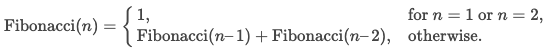


---
Example: The Fibonacci sequence for 8 iterations is (0+0) = 1, (0+1) = 1, (1+1) = 2, (1+2) = 3, (2+3) = 5, (3+5) = 8, (5+8) = 13, (8+13) = 21 and so on...




---

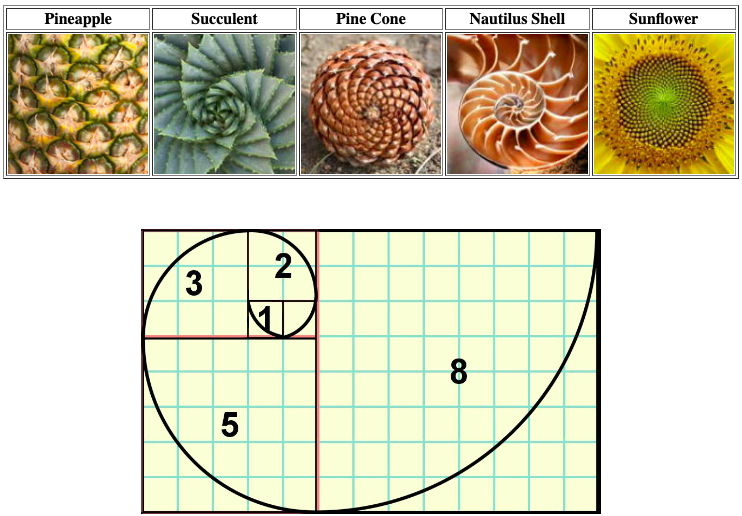


The Fibonacci spiral, or golden spiral, is a geometic represntation of the fibonacci sequece as seen in nature. Nature loves the Fibonacci spiral and it can be seen everywhere!

---
Source for inspiration and image 1: https://www.juliabloggers.com/adjusting-to-julia-generating-the-fibonacci-sequence/
Source for image 2 and 3 and explanation of spiral: https://www2.nau.edu/lrm22/lessons/fibonacci/fibonacci.html

***Inspiration***: https://www.facebook.com/MATLAB/videos/fibonacci-spiral/611858454538512/
- MATLAB Facebook

In [ ]:
# Define Fibionacci Sequence

function fibs(n)
  fib_nums = [0, 1, 1]
  for i in 3:n
    push!(fib_nums, fib_nums[end-1] + fib_nums[end]) # Use push! to add elements to fib_vals
  end
  return fib_nums # Return the fib_nums vector
end

println("$(fibs(10))")

[0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55]


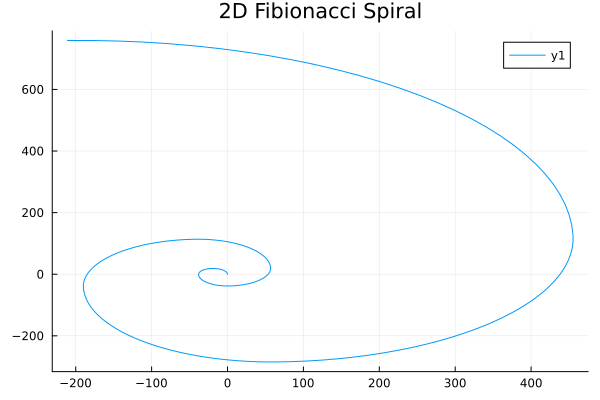

In [ ]:
# Create 2D Spiral Fibionacci Sequence
using Plots
function fib_spiral(num_iter)

   # Call Normal Fibionacci Sequence Function
    fib_nums = fibs(num_iter)

    #Initialize
    theta = 0.0
    x = [0.0]
    y = [0.0] # since push! wants floating numbers

    for i in 1:num_iter
        radius = fib_nums[i]
        angle_step = π / 2  # rotates spiral by 90 degrees
        steps = 30  #30 new points for each radius so we get smooth arc

        for j in 1:steps
            angle = theta + j * angle_step / steps  # calculates angle at each point, increases angle incrementally
            x_new = x[end] + radius * cos(angle)    # calculates x-coord using prior x + radius (current fib value) cos gives horizontal displacement
            y_new = y[end] + radius * sin(angle)    # calculates y-coord using prior y + radius (current fib value) sin gives vertical displacement
            push!(x, x_new) # appends new x and y values
            push!(y, y_new)
        end
        theta += angle_step  # ensures angle was turned 90 degrees and next iteration will start there
    end
    plot!(x, y, title="2D Fibionacci Spiral")
end
fib_spiral(10)

In [ ]:
# Create 3D Spiral Fibionacci Sequence
using Plots

function fib_spiral_3D(num_iter) # Go through this code for a specified number of iterations

    fib_nums = fibs(num_iter) # Call fibs(num_iter)

    #Initialize
    theta = 0.0
    x = [0.0]
    y = [0.0]
    z = [0.0]

    for i in 1:num_iter
        radius = fib_nums[i]
        angle_step = π / 2
        steps = 30

        for j in 1:steps
            angle = theta + j * angle_step / steps
            x_new = x[end] + radius * cos(angle)
            y_new = y[end] + radius * sin(angle)
            z_new = z[end] + 0.01 # Take small steps to stretch the spiral upward
            push!(x, x_new)
            push!(y, y_new)
            push!(z, z_new)
        end
        theta += angle_step
    end
    scatter3d(x, y, z, title="3D Fibionacci Spiral")
end
fib_spiral_3D(10)

LoadError: UndefVarError: fibs not defined

# Modules
Modules are used to orgainize code into units. Modules are awesome becuase they allow us to store multiple items such as functions, arrays, variables, struts, etc.

In a way they act as mini-packages.

Documentation: https://docs.julialang.org/en/v1/manual/modules/

In [ ]:
# Modules in Julia

module MyFibModule # Recomened to use uppercase letters and not indent

# Include package used
using Plots
using GR


# Normal Fibionacci Sequence
function fibs(n)
  fib_nums = [1, 1]
  for i in 3:n
    push!(fib_nums, fib_nums[end-1] + fib_nums[end]) # Use push! to add elements to fib_vals
  end
  return fib_nums # Return the fib_nums vector
end


# Create 2D Spiral Fibionacci Sequence
function fib_spiral(num_iter)
    fib_nums = fibs(num_iter)
    theta = 0.0
    x = [0.0]
    y = [0.0]
    for i in 1:num_iter
        radius = fib_nums[i]
        angle_step = π / 2
        steps = 30
        for j in 1:steps
            angle = theta + j * angle_step / steps
            x_new = x[end] + radius * cos(angle)
            y_new = y[end] + radius * sin(angle)
            push!(x, x_new)
            push!(y, y_new)
        end
        theta += angle_step
    end
    plot(x, y, title="2D Fibionacci Spiral")
end


# Create 3D Spiral Fibionacci Sequence
function fib_spiral_3D(num_iter)
  fib_nums = fibs(num_iter)
  theta = 0.0
  x = [0.0]
  y = [0.0]
  z = [0.0]


  # Let's animate this!
  @gif for i in 1:num_iter
      radius = i
      angle_step = π / 2
      steps = 30
      for j in 1:steps
          angle = theta + j * angle_step / steps
          x_new = x[end] + radius * cos(angle)
          y_new = y[end] + radius * sin(angle)
          z_new = z[end] + 0.1
          push!(x, x_new)
          push!(y, y_new)
          push!(z, z_new)
      end
      theta += angle_step
    end
    scatter3d!(x, y, z, title="3D Fibionacci Spiral")
end


# Array
n = [10, 100, 100]

end

Main.MyFibModule

Animation documentation: https://www.juliafordatascience.com/animations-with-plots-jl/

In [ ]:
# Import MyFibModule
using .MyFibModule


# Calls fib_spiral_3D function from MyFibModule
fib_spiral_3D(10) # Indexing for array starts at 1

LoadError: UndefVarError: fibs not defined

# Some VERY cool plots!
These plots come courtesy of Thomas Brelodd (@tbreloff) from the Juliaplots website: https://docs.juliaplots.org/stable/

Github to plots: https://github.com/JuliaPlots/PlotDocs.jl

Github to license: https://github.com/JuliaPlots/PlotDocs.jl/blob/master/LICENSE

In [ ]:
using Pkg
Pkg.add("Plots")

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


[ Info: Saved animation to /content/tmp.gif


Plots.AnimatedGif("/content/tmp.gif")
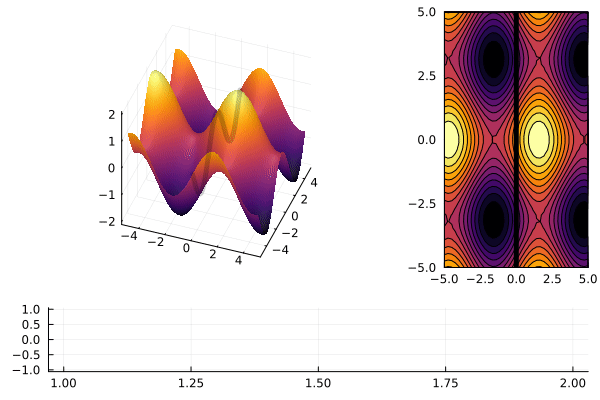

In [ ]:
using Plots

default(legend = false)             # removes legend
x = y = range(-5, 5, length = 40)   # creates range of values
zs = zeros(0, 40)
n = 100     # number of frames for animation

@gif for i in range(0, stop = 2π, length = n)   # Range for animations, i from 0 to 2π, n = number of steps
    f(x, y) = sin(x + 10sin(i)) + cos(y)   # Defines functio f() that generates the z value

    # create a plot with 3 subplots and a custom layout
    l = @layout [a{0.7w} b; c{0.2h}]    # plot a has 70% width, b remaining 30% width, and c 20% height
    p = plot(x, y, f, st = [:surface, :contourf], layout = l) # 3D surface plot and 2D contour (plots a and b)
    # essentally a heat map,:contourf is heatmap-like

    # induce a slight oscillating camera angle sweep, in degrees (azimuth, altitude)
    plot!(p[1], camera = (10 * (1 + cos(i)), 40)) # p[1] updates surface plot

    # add a tracking line
    fixed_x = zeros(40)   # used for plot c
    z = map(f, fixed_x, y)  # calculates z values of function f(), tracks function's behavior over time
    plot!(p[1], fixed_x, y, z, line = (:black, 5, 0.2)) # black tracing line
    vline!(p[2], [0], line = (:black, 5)) # vertical line to contour plot

    # add to and show the tracked values over time
    # appeneds new z values to zs array
    global zs = vcat(zs, z')
    plot!(p[3], zs, alpha = 0.2, palette = cgrad(:blues).colors) # adds zs values to 3 subplot, blue translusive color gradient
end


# ***Sources***
*Creators' purpose statment:* https://julialang.org/blog/2012/02/why-we-created-julia/

*Basic Data Types and Basic Operations:* https://discdown.org/fabulousjulia/pages/introduction/basis_datatypes_and_operations/#:~:text=Julia%20supports%20basic%20data%20types,is%20a%20subtype%20of%20Any%20.
https://docs.julialang.org/en/v1/base/arrays/



---

### ***Information explaining all these processes can be found in the Julia documentation.***
https://docs.julialang.org/en/v1/

Here are some specific links
*Types (Julia documentation):*https://docs.julialang.org/en/v1/manual/types/#:~:text=The%20abstract%20type%20keyword%20introduces,of%20this%20%22parent%22%20type

*Arrays (Julia documentation):* https://docs.julialang.org/en/v1/manual/arrays/

*Methods/Multidispatch (Julia documentation):* https://docs.julialang.org/en/v1/manual/methods/#Methods

*Reading and Writing:* Documentation: https://docs.julialang.org/en/v1/base/io-network/

*Constructors (Julia documentation):* https://docs.julialang.org/en/v1/manual/constructors/index.html

*Libraries in Julia:* https://docs.julialang.org/en/v1/stdlib/ArgTools/

*Mathmatical Operations*
https://docs.julialang.org/en/v1/manual/mathematical-operations/
